<a href="https://colab.research.google.com/github/9characters/Project/blob/master/YOLO_Custom_Manish.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [0]:
# clone darknet repo
!git clone https://github.com/AlexeyAB/darknet

Cloning into 'darknet'...
remote: Enumerating objects: 12, done.
remote: Counting objects: 100% (12/12), done.
remote: Compressing objects: 100% (12/12), done.
remote: Total 13639 (delta 0), reused 2 (delta 0), pack-reused 13627
Receiving objects: 100% (13639/13639), 12.30 MiB | 13.37 MiB/s, done.
Resolving deltas: 100% (9295/9295), done.


In [0]:
# change makefile to have GPU and OPENCV enabled
%cd darknet
!sed -i 's/OPENCV=0/OPENCV=1/' Makefile
!sed -i 's/GPU=0/GPU=1/' Makefile
!sed -i 's/CUDNN=0/CUDNN=1/' Makefile

/content/darknet


In [0]:
# verify CUDA
!/usr/local/cuda/bin/nvcc --version

nvcc: NVIDIA (R) Cuda compiler driver
Copyright (c) 2005-2019 NVIDIA Corporation
Built on Sun_Jul_28_19:07:16_PDT_2019
Cuda compilation tools, release 10.1, V10.1.243


In [0]:
# make darknet (build)
!make

mkdir -p ./obj/
mkdir -p backup
chmod +x *.sh
g++ -std=c++11 -std=c++11 -Iinclude/ -I3rdparty/stb/include -DOPENCV `pkg-config --cflags opencv4 2> /dev/null || pkg-config --cflags opencv` -DGPU -I/usr/local/cuda/include/ -DCUDNN -Wall -Wfatal-errors -Wno-unused-result -Wno-unknown-pragmas -fPIC -Ofast -DOPENCV -DGPU -DCUDNN -I/usr/local/cudnn/include -c ./src/image_opencv.cpp -o obj/image_opencv.o
./src/image_opencv.cpp: In function ‘void draw_detections_cv_v3(void**, detection*, int, float, char**, image**, int, int)’:
./src/image_opencv.cpp:910:23: warning: variable ‘rgb’ set but not used [-Wunused-but-set-variable]
                 float rgb[3];
                       ^~~
./src/image_opencv.cpp: In function ‘void cv_draw_object(image, float*, int, int, int*, float*, int*, int, char**)’:
./src/image_opencv.cpp:1391:14: warning: unused variable ‘buff’ [-Wunused-variable]
         char buff[100];
              ^~~~
./src/image_opencv.cpp:1367:9: warning: unused variable ‘it_tb_res’ [-W

In [0]:
# get yolov3 pretrained coco dataset weights
!wget https://pjreddie.com/media/files/yolov3.weights

--2020-06-07 08:38:55--  https://pjreddie.com/media/files/yolov3.weights
Resolving pjreddie.com (pjreddie.com)... 128.208.4.108
Connecting to pjreddie.com (pjreddie.com)|128.208.4.108|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 248007048 (237M) [application/octet-stream]
Saving to: ‘yolov3.weights’

yolov3.weights      100%[===================>] 236.52M   333KB/s    in 10m 56s 

2020-06-07 08:49:53 (369 KB/s) - ‘yolov3.weights’ saved [248007048/248007048]



In [0]:
# define helper functions
def imShow(path):
  import cv2
  import matplotlib.pyplot as plt
  %matplotlib inline

  image = cv2.imread(path)
  height, width = image.shape[:2]
  resized_image = cv2.resize(image,(3*width, 3*height), interpolation = cv2.INTER_CUBIC)

  fig = plt.gcf()
  fig.set_size_inches(18, 10)
  plt.axis("off")
  plt.imshow(cv2.cvtColor(resized_image, cv2.COLOR_BGR2RGB))
  plt.show()

# use this to upload files
def upload():
  from google.colab import files
  uploaded = files.upload() 
  for name, data in uploaded.items():
    with open(name, 'wb') as f:
      f.write(data)
      print ('saved file', name)

# use this to download a file  
def download(path):
  from google.colab import files
  files.download(path)

In [0]:
# run darknet detection
!./darknet detect cfg/yolov3.cfg yolov3.weights data/person.jpg

In [0]:
# show image using our helper function
imShow('predictions.jpg')

In [0]:
pwd

'/content/darknet'

In [0]:
# look we can run another detection!
!./darknet detect cfg/yolov3.cfg yolov3.weights data/dog.jpg
imShow('predictions.jpg')

In [0]:
from google.colab import files
files.upload()

Saving IMG_0894.JPG to IMG_0894.JPG


{'IMG_0894.JPG': b'\xff\xd8\xff\xe1>mExif\x00\x00MM\x00*\x00\x00\x00\x08\x00\n\x01\x0f\x00\x02\x00\x00\x00\x06\x00\x00\x00\x86\x01\x10\x00\x02\x00\x00\x00\t\x00\x00\x00\x8c\x01\x12\x00\x03\x00\x00\x00\x01\x00\x01\x00\x00\x01\x1a\x00\x05\x00\x00\x00\x01\x00\x00\x00\x96\x01\x1b\x00\x05\x00\x00\x00\x01\x00\x00\x00\x9e\x01(\x00\x03\x00\x00\x00\x01\x00\x02\x00\x00\x011\x00\x02\x00\x00\x00\x05\x00\x00\x00\xa6\x012\x00\x02\x00\x00\x00\x14\x00\x00\x00\xac\x02\x13\x00\x03\x00\x00\x00\x01\x00\x01\x00\x00\x87i\x00\x04\x00\x00\x00\x01\x00\x00\x00\xc0\x00\x00\x06TApple\x00iPhone 6\x00\x00\x00\x00\x00H\x00\x00\x00\x01\x00\x00\x00H\x00\x00\x00\x0111.3\x00\x002018:05:12 09:09:11\x00\x00 \x82\x9a\x00\x05\x00\x00\x00\x01\x00\x00\x02F\x82\x9d\x00\x05\x00\x00\x00\x01\x00\x00\x02N\x88"\x00\x03\x00\x00\x00\x01\x00\x02\x00\x00\x88\'\x00\x03\x00\x00\x00\x01\x00 \x00\x00\x90\x00\x00\x07\x00\x00\x00\x040221\x90\x03\x00\x02\x00\x00\x00\x14\x00\x00\x02V\x90\x04\x00\x02\x00\x00\x00\x14\x00\x00\x02j\x91\x01\x00\x07

In [0]:
cd OIDv4_ToolKit/

/content/OIDv4_ToolKit


/content/darknet
 CUDA-version: 10010 (10010), cuDNN: 7.6.5, GPU count: 1  
 OpenCV version: 3.2.0
 0 : compute_capability = 610, cudnn_half = 0, GPU: Tesla P4 
net.optimized_memory = 0 
mini_batch = 1, batch = 1, time_steps = 1, train = 0 
   layer   filters  size/strd(dil)      input                output
   0 conv     32       3 x 3/ 1    416 x 416 x   3 ->  416 x 416 x  32 0.299 BF
   1 conv     64       3 x 3/ 2    416 x 416 x  32 ->  208 x 208 x  64 1.595 BF
   2 conv     32       1 x 1/ 1    208 x 208 x  64 ->  208 x 208 x  32 0.177 BF
   3 conv     64       3 x 3/ 1    208 x 208 x  32 ->  208 x 208 x  64 1.595 BF
   4 Shortcut Layer: 1,  wt = 0, wn = 0, outputs: 208 x 208 x  64 0.003 BF
   5 conv    128       3 x 3/ 2    208 x 208 x  64 ->  104 x 104 x 128 1.595 BF
   6 conv     64       1 x 1/ 1    104 x 104 x 128 ->  104 x 104 x  64 0.177 BF
   7 conv    128       3 x 3/ 1    104 x 104 x  64 ->  104 x 104 x 128 1.595 BF
   8 Shortcut Layer: 5,  wt = 0, wn = 0, outputs: 104 x 

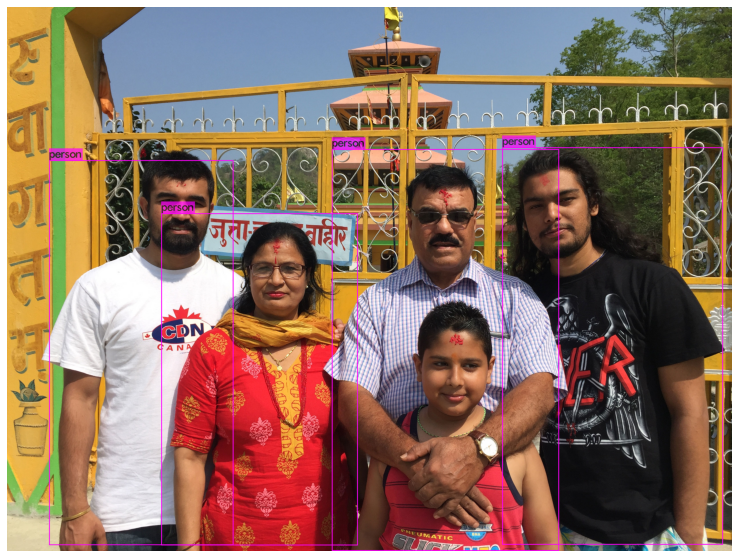

In [0]:
%cd darknet
!./darknet detect cfg/yolov3.cfg yolov3.weights /content/OIDv4_ToolKit/IMG_0894.JPG
imShow('predictions.jpg')

/content


In [0]:
!mv /content/darknet/kunji.jpg /content/darknet/data

In [0]:
cd ..

/content


In [0]:
#Creating Dataset for YOLOv3
!git clone https://github.com/theAIGuysCode/OIDv4_ToolKit

Cloning into 'OIDv4_ToolKit'...
remote: Enumerating objects: 444, done.
remote: Total 444 (delta 0), reused 0 (delta 0), pack-reused 444
Receiving objects: 100% (444/444), 34.09 MiB | 16.06 MiB/s, done.
Resolving deltas: 100% (158/158), done.


In [0]:
cd OIDv4_ToolKit/

/content/OIDv4_ToolKit


In [0]:
!pip install -r requirements.txt

     |████████████████████████████████| 3.1MB 7.8MB/s 
     |████████████████████████████████| 6.2MB 52.5MB/s 
     |████████████████████████████████| 51kB 7.3MB/s 
  Found existing installation: botocore 1.16.19
    Uninstalling botocore-1.16.19:
      Successfully uninstalled botocore-1.16.19
  Found existing installation: rsa 4.0
    Uninstalling rsa-4.0:
      Successfully uninstalled rsa-4.0


In [0]:
cd OIDv4_ToolKit/

/content/OIDv4_ToolKit


In [0]:
!python main.py downloader --classes Helmet Football --type_csv train --limit 400


		   ___   _____  ______            _    _    
		 .'   `.|_   _||_   _ `.         | |  | |   
		/  .-.  \ | |    | | `. \ _   __ | |__| |_  
		| |   | | | |    | |  | |[ \ [  ]|____   _| 
		\  `-'  /_| |_  _| |_.' / \ \/ /     _| |_  
		 `.___.'|_____||______.'   \__/     |_____|
	

             _____                    _                 _             
            (____ \                  | |               | |            
             _   \ \ ___  _ _ _ ____ | | ___   ____  _ | | ____  ____ 
            | |   | / _ \| | | |  _ \| |/ _ \ / _  |/ || |/ _  )/ ___)
            | |__/ / |_| | | | | | | | | |_| ( ( | ( (_| ( (/ /| |    
            |_____/ \___/ \____|_| |_|_|\___/ \_||_|\____|\____)_|    
                                                          
        
    [INFO] | Downloading Helmet.
   [ERROR] | Missing the class-descriptions-boxable.csv file.
[DOWNLOAD] | Do you want to download the missing file? [Y/n] Y
...145%, 0 MB, 42499 KB/s, 0 seconds passed
[DOWNLOAD] | File c

In [0]:
!python convert_annotations.py

Currently in subdirectory: train
Converting annotations for class:  Helmet
100% 400/400 [00:10<00:00, 36.73it/s]
Converting annotations for class:  Football
100% 400/400 [00:06<00:00, 57.41it/s]


In [0]:
!rm -r /content/OIDv4_ToolKit/OID/Dataset/train/Helmet/Label

In [0]:
#Moving all the directories from Helmet folder to Helmet_Football folder
import shutil
import os

source = '/content/OIDv4_ToolKit/OID/Dataset/train/Helmet/'
dest1 = '/content/OIDv4_ToolKit/OID/Dataset/train/Helmet_Football/'

files = os.listdir(source) 

for f in files:
    shutil.move(source+f, dest1)

In [0]:
#Moving all the directories from Football folder to Helmet_Football folder
import shutil
import os

source = '/content/OIDv4_ToolKit/OID/Dataset/train/Football/'
dest1 = '/content/OIDv4_ToolKit/OID/Dataset/train/Helmet_Football/'

files = os.listdir(source)

for f in files:
    shutil.move(source+f, dest1)

In [0]:
cd darknet/cfg

/content/darknet/cfg


In [0]:
#Importing custom config file
from google.colab import files
files.upload()

In [0]:
!mv /content/OIDv4_ToolKit/OID/Dataset/train/obj /content/darknet/data

In [0]:
cd ..

/content/darknet


In [0]:
cd ..

/content


In [0]:
!ln -s /content/drive/My\ Drive/ /mydrive
!ls /mydrive

'Baby Shower'		   'Getting started.pdf'
'Colab Notebooks'	   'Nischal Dada'
 corona			    obamanet.zip
 first-order-motion-model   original_horizontal_steam_banners.tar
 generated.mp4


In [0]:
cd ..

/content/darknet/data


In [0]:
cd mydrive

/content/drive/My Drive


In [0]:
!mkdir test_folder_manish

In [0]:
cd /content/darknet/data

/content/darknet/data/obj


In [0]:
!mv /content/darknet/data/obj/generate_train.py  /content/darknet/data

In [0]:
!python generate_train.py

In [0]:
cd mydrive/yolov3/backup

[Errno 2] No such file or directory: 'mydrive/yolov3/backup'
/content/darknet


In [0]:
# upload pretrained convolutional layer weights
!wget http://pjreddie.com/media/files/darknet53.conv.74

URL transformed to HTTPS due to an HSTS policy
--2020-06-07 11:27:02--  https://pjreddie.com/media/files/darknet53.conv.74
Resolving pjreddie.com (pjreddie.com)... 128.208.4.108
Connecting to pjreddie.com (pjreddie.com)|128.208.4.108|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 162482580 (155M) [application/octet-stream]
Saving to: ‘darknet53.conv.74’

darknet53.conv.74   100%[===================>] 154.96M   125KB/s    in 16m 25s 

2020-06-07 11:43:29 (161 KB/s) - ‘darknet53.conv.74’ saved [162482580/162482580]



In [0]:
#Paste the below code into the inspect console to generate autoclicks
function ClickConnect(){
console.log("Working"); 
document.querySelector("colab-toolbar-button#connect").click() 
}
setInterval(ClickConnect,60000)

In [0]:
!./darknet detector train data/obj.data cfg/yolov3_custom.cfg darknet53.conv.74 -dont_show

In [0]:
pwd

'/content'

In [0]:
cd darknet

/content/darknet


In [0]:
pwd

'/content'

In [0]:
%cd cfg
!sed -i 's/batch=64/batch=1/' yolov3_custom.cfg
!sed -i 's/subdivisions=15/subdivisions=1/' yolov3_custom.cfg
%cd ..

/content/darknet/cfg
/content/darknet
